In [1]:
from typing import Tuple, List

import jax
import optax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML
from PIL import Image
from jmd_imagescraper.core import *
from jmd_imagescraper.imagecleaner import *
from jax.random import PRNGKey as jkey
from chex import Array, Shape, PRNGKey

from architectures import *
from training_gan import *

## No i co taki generator właściwie potrafi, he?
Ponisze 2 celki to stałe i funkcję pomocnicze, mozna pominąc

In [2]:
SEED                    = 401486
RESTORE_DIR             = "checkpoints/amanita/seed_22237/phase_1/restored"
RESTORE_EPOCH           = 200
RECONSTRUCTED_IMG_PATH  = "datasets/amanita/amanita_57.png"
UNRELATED_IMG_PATH      = "datasets/anime/166_2000.jpg"

In [3]:
key = jkey(SEED)


def load_img(img_path: str):

    return jnp.array(Image.open(img_path).resize((64, 64)).convert('RGB')) / 255


def compare_shrooms(img_gen: Array, img_goal: Array):

    _, (ax_gen, ax_goal) = plt.subplots(1, 2)
    ax_gen.imshow(img_gen)
    ax_goal.imshow(img_goal)
    ax_gen.set_axis_off()
    ax_goal.set_axis_off()


def plot_loss(loss_trace: Array):
    
    steps = jnp.arange(len(loss_trace)) + 1
    plt.plot(steps, loss_trace)
    plt.ylabel("loss value")
    plt.xlabel("step")


def animate_and_save(batch_gen: Array, save_path: str):

    # Animate process
    fig, ax = plt.subplots()
    fig.set_size_inches(5, 5)
    frames = []
    for i in range(batch_gen.shape[0]):

        frame = ax.imshow(batch_gen[i], animated=True)
        frame.axes.set_axis_off()
        frames.append([frame])

    # Save and display animation
    writervideo = animation.PillowWriter(fps=30)
    ani = animation.ArtistAnimation(fig, frames, interval=50, blit=True, repeat_delay=1000)
    ani.save(save_path, writer=writervideo)
    return HTML(ani.to_jshtml())

Funkcja dopasowująca wektory z *latent space* do obrazka docelowego:

In [4]:
def mse(m1: Array, m2: Array):

    m1 = jnp.reshape(m1, (-1,))
    m2 = jnp.reshape(m2, (-1,))

    diff = m1 - m2

    return diff @ diff


def mse_loss(seed_vector: Array, state_gen: TrainState, img_goal: Array):
    
    img_gen = jnp.squeeze(generateV2(state_gen, jnp.expand_dims(seed_vector, axis=0)))
    
    return mse(img_gen, img_goal)


def fit(
    init_vector: Array,
    state_gen: TrainState,
    optimizer: optax.GradientTransformation,
    img_goal: Array,
    steps: int,
) -> Tuple[Array, Array, List]:

    opt_state = optimizer.init(init_vector)

    @jax.jit
    def step(params, opt_state):

        loss_value, grads = jax.value_and_grad(mse_loss)(params, state_gen, img_goal)
        updates, opt_state = optimizer.update(grads, opt_state, params)
        params = optax.apply_updates(params, updates)

        return params, opt_state, loss_value
    
    params = init_vector
    loss_acc = []
    evolution_batch = [params]
    for i in range(steps):

        params, opt_state, loss_value = step(params, opt_state)
        loss_acc.append(loss_value)
        evolution_batch.append(params)
    
    return params, generateV2(state_gen, jnp.stack(evolution_batch)), jnp.array(loss_acc)

### Wczytywanie zapisanego stanu
Plotuje `MONITOR_VECTORS` z zapisanego stanu:

[Info] loaded state from epoch 200 checkpoint


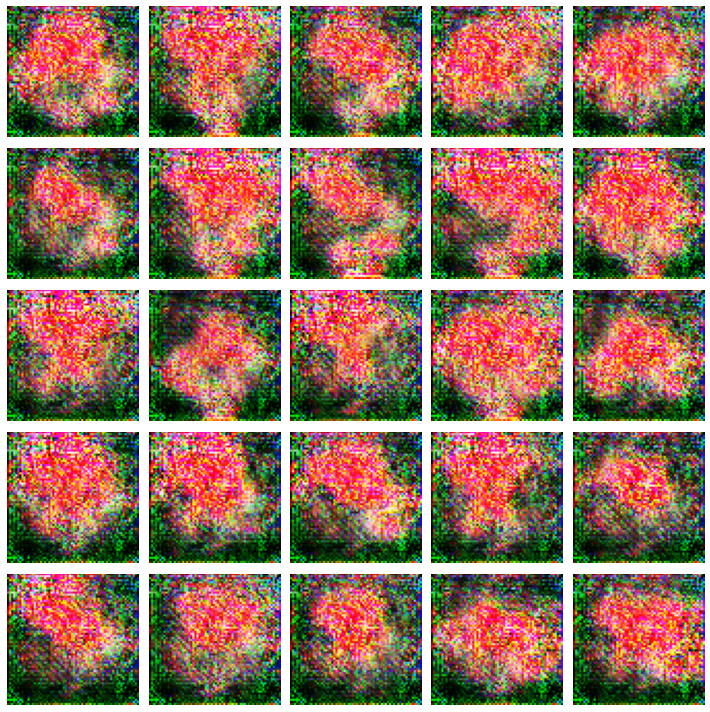

In [5]:
_, state_dis, state_gen = load_state(checkpoint_dir=RESTORE_DIR, epoch=RESTORE_EPOCH)
generated = generateV2(state_gen, MONITOR_VECTORS)

plot_samples(key, generated)

Obrazek który będziemy odtwarzac:

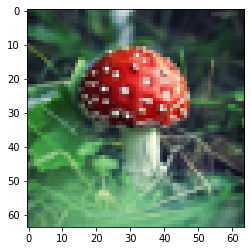

In [6]:
img_goal = load_img(RECONSTRUCTED_IMG_PATH)
plt.imshow(img_goal);

Sztuczny muchomor na podstawie losowego wektora:

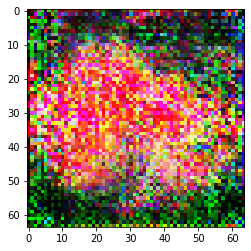

In [7]:
key, noise_key = jax.random.split(key)
noise_vector = jax.random.normal(noise_key, shape=(128,))

img_init = jnp.squeeze(generateV2(state_gen, jnp.expand_dims(noise_vector, axis=0)))
plt.imshow(img_init)

### Gradient descent do docelowego obrazka

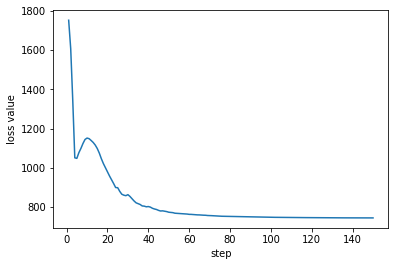

In [8]:
optimizer = optax.sgd(learning_rate=0.01, momentum=0.9)
_, generated_batch, loss_trace = fit(
    noise_vector,
    state_gen,
    optimizer,
    img_goal,
    150
)

plot_loss(loss_trace)

Porównanie finalnie wygenerowanego obrazka z docelowym:

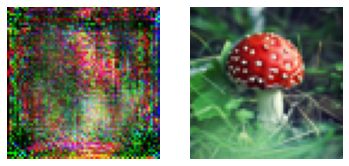

In [9]:
img_final = generated_batch[-1]
compare_shrooms(img_final, img_goal)

Przebieg procesu dopasowywania wektora z *latent space* (zapisany w pliku `TrainingGAN/amanita_noise2shroom.gif`):

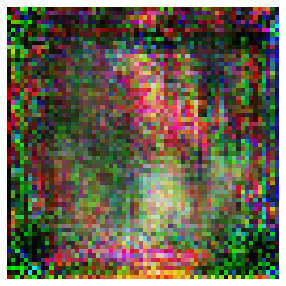

In [10]:
animate_and_save(generated_batch, "amanita_noise2shroom.gif")

Teraz spróbujemy dopasowac się do obrazka niepowiązanego ze zbiorem muchomorów:

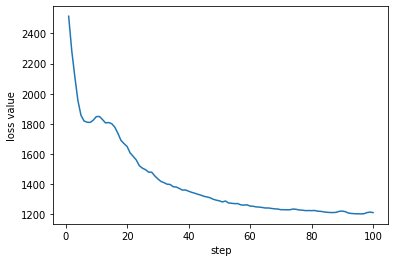

In [11]:
img_anime_girl = load_img(UNRELATED_IMG_PATH)

optimizer = optax.sgd(learning_rate=0.01, momentum=0.9)
_, generated_batch, loss_trace = fit(
    noise_vector,
    state_gen,
    optimizer,
    img_anime_girl,
    100
)

plot_loss(loss_trace)

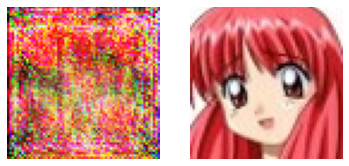

In [12]:
img_final = generated_batch[-1]
compare_shrooms(img_final, img_anime_girl)

Przebieg zapisany jest równierz w pliku `TrainingGAN/amanita_noise2girl.gif`, a tutaj animacja:

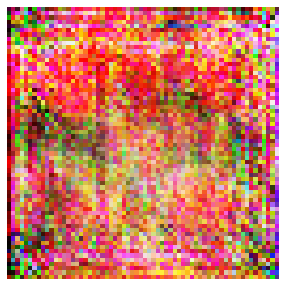

In [13]:
animate_and_save(generated_batch, "amanita_noise2girl.gif")

### Interpolacja z muchomora A do muchomora B
Ponizej obrazek startowy (lewy) oraz docelowy (prawy):

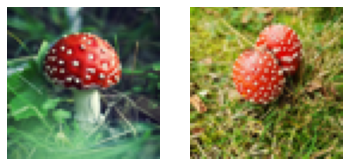

In [14]:
amanita_a = img_goal
amanita_b = load_img("datasets/amanita/amanita_425.png")
compare_shrooms(amanita_a, amanita_b)

In [15]:
optimizer = optax.sgd(learning_rate=0.01, momentum=0.9)

latent_a, generated_batch_a, _ = fit(
    noise_vector,
    state_gen,
    optimizer,
    amanita_a,
    150
)
latent_b, generated_batch_b, _ = fit(
    noise_vector,
    state_gen,
    optimizer,
    amanita_b,
    150
)

Przebieg zapisany jest równierz w pliku `TrainingGAN/amanita_interpolation.gif`, a tutaj animacja:

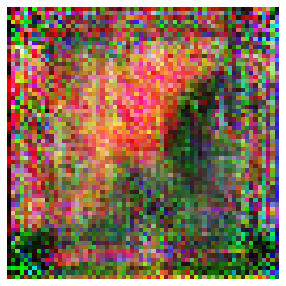

In [16]:
# Generate interpolation
latent_process = []
delta = latent_b - latent_a
p = jnp.linspace(0, 1, 100)
for i, p_val in enumerate(p):
    latent_process.append(latent_a + p_val * delta)
batch_process = generateV2(state_gen, jnp.stack(latent_process))

animate_and_save(batch_process, 'amanita_interpolation.gif')

## Jesteśmy wolni - możemy iść!
### Moje refleksje na temat labu z GANem

Ogólnie laboratorium okazało się baaardzo długie i wyczerpujące, najpierw musiałem znaleźc maszynę z GPU, poniewaz moje CPU (apple m1) potrzebowało az 40 min na przeliczenie pojedynczej epoki. Sama implementacja w JAX okazała się łatwiejsza niz przypuszczałem, szczególnie przyjemne było skorzystanie ze świetnego wsparcia **AutoGrad** poprzez `jax.grad()`, co zniwelowało potrzebę "zamrazania" modelu. Jednak wisienką na torcie był trening, który okazał się znaczną częścią czasu poświęconego na to laboratorium, do którego mam najwięcej uwag i wskazówek.

### Moje problemy i wskazówki:
* Gdy zacząłem trening, nie wiedziałem do jakiego kształtu krzywych dązymy, pomocny okzał się wcześniej juz linkowany [artykuł](https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/), który oprócz problemów z treningiem GANa, ukazał modelowy przebieg. Fajnie by było gdyby instrukcja równierz pokazała jaki jest oczekiwany kształt krzywych *loss*
* Drugim duzym problemem okazał się dobór datasetu. Po doswiadczeniach z tego laboratorium, odnosze wrazenie ze jego jakośc znacząco wpływa na proces treningu. Uwazam ze skoro ten lab i tak jest wyjatkowo skąplikowany i czasochłonny, to załączenie lub zasugerowanie konkretnego datasetu (nie chodzi mi o duckduckgo) było by wielce pomocne i student mógłby od razu wyeliminowac jeden z potencjalnych czynników treningu nieprzynoszącego efektów.
* Ostatni duzy problem jaki napotkałem to znalezienie GPU. Na szczęście mam dostęp do małego klastra agh (*labsim* z kierunku teleinformatyka na naszym wydziale, z którego korzystamy z moim zespołem przy prowadzeniu badań nad sieciami bezprzewodowymi). Jednak nawet mając juz GPU, po pewnym czasie zapełniłem dysk checkpointami modelu które sporo wazyły (ok 30 Mb na stan). Jednak jestem świadom ze problem maszyny zapewniającej efektywny trening nie jest łatwy do rozwiązania i tu kazdy musi znaleźc rozwiązanie indywidualnie.

### Koncowe wnioski

Muszę przyznac ze rozwiązywanie tego labu to był trochę emocjonalny roller coaster. Tzn zaimplementowanie działającego modelu dało sporo satysfakcji. Trening okazał się bardzo uciązliwy i odbierał chęci do zycia. Jednak ostatnia częśc z zastosowaniami GANa i interpolacją między wektorami z *latent space* znowu okazała się bardzo ciekawa. Muszę tez przyznac, ze to laboratorium raczej rozwiązywałem z motywacji własnego rozwoju niz oceny za laboratorium, gdyz od kiedy usłyszałem o istnieniu GANów chciałem je rozgryźc, lecz brakowało mi odwagi i chęci, az do czasu tego labu. Nie sądzę zeby motywacja otrzymania 20 pkt za laboratorium była wystarczająca do wykonania takiej ilości pracy.